In [313]:
import pandas as pd
from numpy import loadtxt
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import preprocessing
from sklearn.model_selection import cross_val_score
import numpy as np
import sys
from datetime import datetime
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt
np.set_printoptions(threshold=sys.maxsize)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [138]:
df_train_txn=pd.read_csv("../../Downloads/ieee-fraud-detection/train_transaction.csv")
df_train_identity=pd.read_csv("../../Downloads/ieee-fraud-detection/train_identity.csv")
df_test_txn=pd.read_csv("../../Downloads/ieee-fraud-detection/test_transaction.csv")
df_test_identity=pd.read_csv("../../Downloads/ieee-fraud-detection/test_identity.csv")

In [307]:
df_train=df_train_txn.merge(df_train_identity, on='TransactionID', how='left')
df_train=df_train.dropna(axis=1,how='all')
df_train.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0

,0,1
isFraud,0.96501,0.03499


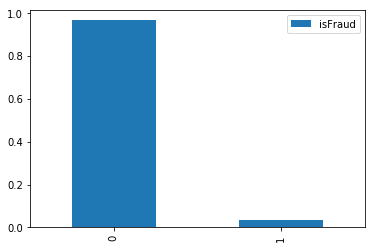

In [317]:
fc = df_train['isFraud'].value_counts(normalize=True).to_frame()
fc.plot.bar()
fc.T

In [320]:
df_train['P_emaildomain'].fillna('unknown',inplace=True)
df_train['R_emaildomain'].fillna('unknown',inplace=True)

inf = pd.DataFrame([], columns=['P_emaildomain','R_emaildomain','Count','isFraud'])
for n in (df_train['P_emaildomain'] + ' ' + df_train['R_emaildomain']).unique():
    p, r = n.split()[0], n.split()[1]
    df = df_train[(df_train['P_emaildomain'] == p) & (df_train['R_emaildomain'] == r)]
    inf = inf.append(pd.DataFrame([p, r, len(df), df['isFraud'].mean()], index=inf.columns).T)

inf.sort_values(by='isFraud', ascending=False).head(10)

,P_emaildomain,R_emaildomain,Count,isFraud
0,yahoo.com,mail.com,1,1
0,anonymous.com,protonmail.com,2,1
0,aol.com,mail.com,3,1
0,unknown,protonmail.com,6,1
0,protonmail.com,gmail.com,4,1
0,protonmail.com,protonmail.com,23,1
0,yahoo.com,protonmail.com,1,1
0,gmail.com,protonmail.com,6,0.833333
0,mail.com,hotmail.com,4,0.75
0,aol.com,protonmail.com,3,0.666667


In [309]:
vcols = [f'V{i}' for i in range(1,340)]
df_train[vcols].isnull().sum() / len(df_train)

V1      0.472935
V2      0.472935
V3      0.472935
V4      0.472935
V5      0.472935
V6      0.472935
V7      0.472935
V8      0.472935
V9      0.472935
V10     0.472935
V11     0.472935
V12     0.128819
V13     0.128819
V14     0.128819
V15     0.128819
V16     0.128819
V17     0.128819
V18     0.128819
V19     0.128819
V20     0.128819
V21     0.128819
V22     0.128819
V23     0.128819
V24     0.128819
V25     0.128819
V26     0.128819
V27     0.128819
V28     0.128819
V29     0.128819
V30     0.128819
V31     0.128819
V32     0.128819
V33     0.128819
V34     0.128819
V35     0.286126
V36     0.286126
V37     0.286126
V38     0.286126
V39     0.286126
V40     0.286126
V41     0.286126
V42     0.286126
V43     0.286126
V44     0.286126
V45     0.286126
V46     0.286126
V47     0.286126
V48     0.286126
V49     0.286126
V50     0.286126
V51     0.286126
V52     0.286126
V53     0.130552
V54     0.130552
V55     0.130552
V56     0.130552
V57     0.130552
V58     0.130552
V59     0.1305

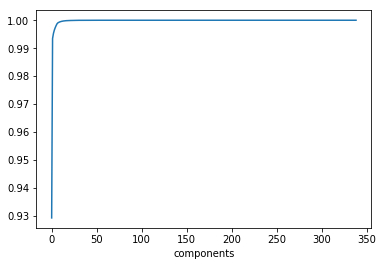

In [314]:
vcols = [f'V{i}' for i in range(1,340)]

pca = PCA()
pca.fit(df_train[vcols].fillna(-1))
plt.xlabel('components')
plt.plot(np.add.accumulate(pca.explained_variance_ratio_))
plt.show()

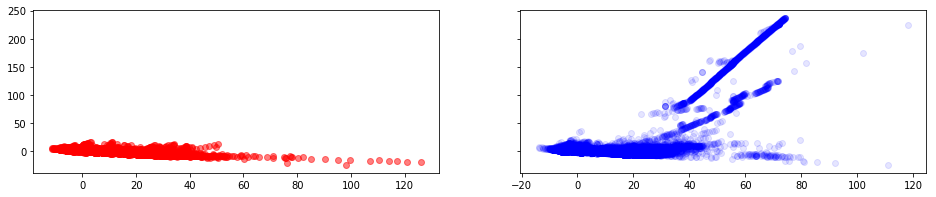

In [316]:
sc = preprocessing.StandardScaler()
#sc = preprocessing.MinMaxScaler()

pca = PCA(n_components=2) #0.99
vcol_pca = pca.fit_transform(sc.fit_transform(df_train[vcols].fillna(-1)))

fig, ax = plt.subplots(1, 2, figsize=(16, 3), sharey=True)
ax[0].scatter(x=vcol_pca[df_train['isFraud'] == 1,0], y=vcol_pca[df_train['isFraud'] == 1,1], alpha=0.5, c='r')
ax[1].scatter(x=vcol_pca[df_train['isFraud'] == 0,0], y=vcol_pca[df_train['isFraud'] == 0,1], alpha=0.1, c='b')
#plt.scatter(x=vcol_pca[:,0], y=vcol_pca[:,1], alpha=0.1, c=train_trn['isFraud'])

In [308]:
for col, values in df_train.iteritems():
    num_uniques = values.nunique()
    print ('{name}: {num_unique}'.format(name=col, num_unique=num_uniques))
    print (values.unique())
    print ('\n')

TransactionID: 590540


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[6.8500000e+01 2.9000000e+01 5.9000000e+01 5.0000000e+01 4.9000000e+01
 1.5900000e+02 4.2250000e+02 1.5000000e+01 1.1700000e+02 7.5887000e+01
 1.6495000e+01 4.0000000e+01 1.0500000e+01 5.7950000e+01 3.0000000e+01
 1.0000000e+02 4.7950000e+01 1.8600000e+02 3.9000000e+01 1.5995000e+02
 1.0795000e+02 7.3950000e+01 1.8400000e+02 2.0000000e+01 3.6990000e+01
 3.5000000e+01 3.6389000e+02 2.0000000e+02 7.7000000e+01 2.1950000e+01
 2.5000000e+01 3.9950000e+01 7.7400000e+02 3.9500000e+01 3.6950000e+01
 4.2294000e+01 3.5950000e+00 2.2600000e+02 1.3095000e+02 3.4000000e+01
 2.1095000e+02 5.0000000e+02 3.8021000e+02 3.5950000e+01 2.4540000e+03
 5.8950000e+01 8.0000000e+01 2.5000000e+02 1.1495000e+02 3.0000000e+02
 4.4500000e+02 3.0810000e+00 6.7670000e+00 5.5400000e+02 2.7793000e+01
 2.8000000e+02 2.8699000e+01 6.0000000e+01 1.0495000e+02 4.1195000e+02
 1.2567400e+02 4.2596000e+01 4.4500000e+01 8.8950000e+01 1.4000000e+02
 3.1895000e+02 7.7821000e+01 1.0700000e+02 5.2700000e+02 1.0850000e+02
 2.150

card6: 4
['credit' 'debit' nan 'debit or credit' 'charge card']


addr1: 332
[315. 325. 330. 476. 420. 272. 126. 337. 204.  nan 226. 170. 184. 264.
 299. 441. 472. 251. 469. 191. 485. 122. 220. 205. 387. 181. 231. 436.
 327. 343. 123. 502. 269. 158. 433. 143. 225. 492. 177. 512. 310. 308.
 418. 494. 253. 428. 203. 110. 444. 498. 194. 536. 384. 324. 295. 448.
 157. 171. 224. 491. 274. 432. 459. 106. 296. 254. 452. 347. 335. 305.
 161. 221. 154. 130. 465. 451. 331. 511. 486. 312. 242. 131. 508. 332.
 283. 216. 431. 391. 333. 496. 304. 167. 261. 399. 164. 142. 393. 258.
 375. 483. 404. 482. 148. 218. 127. 403. 374. 477. 478. 241. 504. 453.
 535. 100. 239. 152. 500. 356. 198. 162. 244. 520. 531. 401. 427. 352.
 540. 456. 371. 409. 529. 505. 503. 346. 359. 499. 298. 190. 454. 172.
 145. 493. 119. 521. 270. 395. 366. 348. 313. 338. 139. 443. 183. 430.
 102. 470. 133. 233. 468. 185. 523. 411. 501. 425. 426. 365. 129. 141.
 137. 249. 402. 386. 290. 111. 132. 278. 506. 128. 213. 514. 314. 445.


R_emaildomain: 60
[nan 'gmail.com' 'hotmail.com' 'outlook.com' 'anonymous.com' 'charter.net'
 'prodigy.net.mx' 'comcast.net' 'live.com.mx' 'icloud.com' 'yahoo.com'
 'aol.com' 'juno.com' 'att.net' 'verizon.net' 'yahoo.com.mx'
 'bellsouth.net' 'servicios-ta.com' 'ymail.com' 'hotmail.es' 'msn.com'
 'optonline.net' 'live.com' 'gmx.de' 'aim.com' 'mail.com' 'me.com'
 'outlook.es' 'cox.net' 'earthlink.net' 'embarqmail.com' 'web.de'
 'sbcglobal.net' 'scranton.edu' 'mac.com' 'twc.com' 'roadrunner.com'
 'yahoo.fr' 'yahoo.de' 'yahoo.es' 'frontiernet.net' 'gmail' 'live.fr'
 'q.com' 'yahoo.co.uk' 'windstream.net' 'suddenlink.net' 'hotmail.fr'
 'ptd.net' 'hotmail.de' 'frontier.com' 'cfl.rr.com' 'hotmail.co.uk'
 'netzero.com' 'netzero.net' 'yahoo.co.jp' 'rocketmail.com'
 'centurylink.net' 'protonmail.com' 'cableone.net' 'sc.rr.com']


C1: 1657
[1.000e+00 2.000e+00 4.000e+00 6.000e+00 1.270e+02 3.000e+00 8.000e+00
 9.200e+01 1.900e+02 5.000e+00 1.200e+01 7.000e+00 2.020e+02 2.100e+01
 1.310e+02 1.600e

C11: 1476
[2.000e+00 1.000e+00 5.000e+00 3.000e+00 8.000e+01 4.000e+00 7.300e+01
 1.320e+02 9.000e+00 1.820e+02 1.340e+02 1.900e+01 8.000e+00 9.400e+01
 1.300e+01 1.800e+01 6.000e+00 7.000e+00 1.540e+02 9.800e+01 5.400e+01
 1.500e+01 0.000e+00 1.370e+02 1.030e+02 1.170e+02 1.200e+01 6.700e+01
 1.470e+02 1.050e+02 2.300e+01 1.000e+01 5.200e+01 1.300e+02 1.140e+02
 8.400e+01 7.700e+01 1.400e+01 1.100e+01 2.500e+01 2.400e+01 7.100e+01
 3.400e+01 5.800e+01 8.100e+01 2.900e+01 1.080e+02 1.860e+02 9.100e+01
 5.000e+01 3.300e+01 8.700e+01 9.700e+01 9.300e+01 6.500e+01 2.200e+01
 1.700e+01 8.800e+01 6.600e+01 9.000e+01 9.200e+01 1.040e+02 1.280e+02
 1.310e+02 4.800e+01 1.490e+02 5.500e+01 5.740e+02 4.000e+01 5.760e+02
 6.100e+01 6.800e+01 7.400e+01 6.000e+01 1.130e+02 1.110e+02 5.700e+01
 1.270e+02 1.070e+02 7.900e+01 8.500e+01 8.300e+01 5.770e+02 3.200e+01
 6.200e+01 7.800e+01 7.500e+01 7.200e+01 4.400e+01 2.600e+01 5.900e+01
 3.100e+01 1.620e+02 9.900e+01 1.610e+02 1.460e+02 1.430e+02 8.200e

[ nan   0.  30.  11.  10.   2.  40.  35.   1.  90.  56. 121. 200. 109.
  22.  46. 107.  20. 222.  39.  19.   8.   5.  32.  14.  71.   9.  23.
  28.  15.  36. 229. 163.  25. 433.  59.  55.  48.  93.  18.  24.   4.
  37.  50.  72.  27.  92.   6.  63.  29.  66. 122.   3.  41.  31. 148.
 152. 145. 288.  33.  16.  57. 242.  67.  42. 438. 318.  69.  21.   7.
 102. 203.  17.  49. 252.  77.  43.  51. 104. 100.  98.  13. 425. 174.
 159. 108. 135.  34. 195. 388. 137. 227. 192. 119. 147. 131.  96. 407.
  53. 105. 230.  12.  80. 309. 183.  61. 106.  65. 459. 282.  26. 270.
 233.  62.  52. 127. 128. 303. 301. 154. 321.  95. 445.  87. 275.  91.
  60. 214. 172. 151.  45. 456. 120. 216. 190. 164.  99. 188. 393.  58.
 213.  86. 132.  88. 274. 175.  84. 199. 139. 217. 364. 324. 291. 126.
 116. 320. 124. 220. 235. 354. 158. 226.  76. 144. 133.  54. 112. 431.
  38. 338. 182.  44. 123. 253. 428. 299. 287. 247. 208. 298. 140.  83.
 141. 212. 166. 231. 117.  70. 352. 207. 115.  82.  75. 300. 165. 345.
 349. 

[           nan 8.30000000e+01 2.60000000e+01 2.10000000e+01
 2.90000000e+01 1.89000000e+02 1.26000000e+02 7.77000000e+02
 1.20000000e+01 2.55000000e+02 0.00000000e+00 7.00000000e+00
 4.00000000e+00 1.28000000e+02 2.00000000e+00 9.40000000e+01
 7.66000000e+02 8.10000000e+01 5.49000000e+02 1.40000000e+02
 4.50416641e+01 4.16660011e-02 1.08041664e+02 2.48041672e+02
 1.11041664e+02 4.04166603e+00 2.91041656e+02 3.04166603e+00
 1.90416660e+01 4.15041656e+02 8.66041687e+02 1.70416660e+01
 1.04166603e+00 1.06041664e+02 3.85041656e+02 2.10416660e+01
 5.80833321e+01 8.33330005e-02 3.35083344e+02 1.00833330e+01
 3.20833321e+01 3.97083344e+02 4.70833321e+01 7.40833359e+01
 1.30833330e+01 2.90083344e+02 3.33083344e+02 7.65083313e+02
 6.20833321e+01 6.00833321e+01 9.70833359e+01 2.29083328e+02
 2.46083328e+02 2.08333302e+00 4.84083344e+02 2.42083328e+02
 2.70833321e+01 7.00833359e+01 3.08333302e+00 2.29125000e+02
 1.25000000e-01 6.21125000e+02 8.81250000e+01 9.11250000e+01
 7.61250000e+01 4.841250

['T' nan 'F']


M3: 2
['T' nan 'F']


M4: 3
['M2' 'M0' nan 'M1']


M5: 2
['F' 'T' nan]


M6: 2
['T' 'F' nan]


M7: 2
[nan 'F' 'T']


M8: 2
[nan 'F' 'T']


M9: 2
[nan 'F' 'T']


V1: 2
[ 1. nan  0.]


V2: 9
[ 1. nan  2.  3.  0.  4.  5.  6.  7.  8.]


V3: 10
[ 1. nan  2.  3.  0.  4.  5.  6.  7.  8.  9.]


V4: 7
[ 1. nan  2.  0.  3.  4.  5.  6.]


V5: 7
[ 1. nan  2.  0.  3.  4.  5.  6.]


V6: 10
[ 1. nan  2.  3.  0.  4.  5.  6.  7.  9.  8.]


V7: 10
[ 1. nan  2.  3.  0.  4.  5.  6.  7.  9.  8.]


V8: 9
[ 1. nan  2.  3.  0.  6.  4.  5.  8.  7.]


V9: 9
[ 1. nan  2.  3.  0.  4.  6.  5.  8.  7.]


V10: 5
[ 0. nan  1.  2.  3.  4.]


V11: 6
[ 0. nan  1.  2.  4.  3.  5.]


V12: 4
[ 1.  0. nan  2.  3.]


V13: 7
[ 1.  0. nan  2.  3.  4.  5.  6.]


V14: 2
[ 1. nan  0.]


V15: 8
[ 0. nan  1.  2.  3.  4.  5.  6.  7.]


V16: 15
[ 0. nan  1.  2.  3.  4.  5.  6.  8.  9. 11.  7. 10. 13. 14. 15.]


V17: 16
[ 0. nan  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15.]


V18: 16
[ 0. nan  1.  2.  3.

[ 0.  1.  2.  4.  3. 11.  6.  5. 12.  7.  8.  9. 15. 10. 16. 13. 17. 14.
 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35.
 36. 37. 38. nan 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52.
 53. 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70.
 71. 72. 73. 74. 75. 76. 77. 78. 79. 80. 81. 82. 83. 84. 85. 86. 87. 88.
 89. 90. 91. 92. 93. 94. 95. 96. 97. 98. 99.]


V106: 56
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23. nan 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34.
 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52.
 53. 54. 55.]


V107: 2
[ 1.  0. nan]


V108: 8
[ 1.  2.  3.  4.  5.  6.  7.  0. nan]


V109: 8
[ 1.  2.  3.  4.  5.  6.  7.  0. nan]


V110: 8
[ 1.  2.  3.  4.  5.  6.  7.  0. nan]


V111: 10
[ 1.  2.  3.  4.  5.  6.  7.  8.  9.  0. nan]


V112: 10
[ 1.  2.  3.  4.  5.  6.  7.  8.  9.  0. nan]


V113: 10
[ 1.  2.  3.  4.  5.  6.  7.  8.  9.  0. nan]


V114

[1.17000000e+02 0.00000000e+00 1.75800000e+03 6.00000000e+01
 1.00000000e+02 5.17500000e+02 1.70919998e+02 1.13169995e+03
 2.90000000e+01 9.31150000e+03 1.45000000e+02 7.74000000e+02
 4.90000000e+01 9.51150000e+03 3.26000000e+02 4.21899994e+02
 5.27000000e+02 5.89500008e+01 1.40000000e+02 1.56800000e+03
 1.89600000e+03 7.70000000e+01 1.81800000e+03 1.08500000e+03
 3.75850006e+02 5.90000000e+01 9.50500000e+02 1.25000000e+02
 2.37949997e+02 2.80000000e+02 1.57899994e+02 5.00000000e+01
 1.07949997e+02 4.35779999e+02 8.00000000e+01 2.00000000e+02
 8.79499969e+01 2.16850006e+02 1.06949997e+02 2.59494995e+03
 1.07000000e+02 1.77949997e+02 6.79499969e+01 1.16300000e+03
 7.40000000e+01 8.80000000e+01 3.00000000e+01 2.00949997e+02
 5.57000000e+02 1.46970001e+02 5.36000000e+02 2.48000000e+02
 3.80000000e+01 2.58920013e+02 6.56000000e+02 1.12989998e+02
 1.51000000e+02 3.70979004e+01 1.50000000e+01 7.41958008e+01
 9.48700027e+01 2.46970001e+02 2.09949997e+02 6.65000000e+02
 2.90000000e+02 2.500000

[0.00000000e+00 9.25000000e+02 1.02500000e+02 2.79699993e+01
 4.17899994e+02 2.90000000e+01 2.50750000e+03 2.50000000e+01
 7.74000000e+02 4.90000000e+01 2.70750000e+03 5.27000000e+02
 5.89500008e+01 6.55000000e+02 1.22500000e+03 4.00000000e+01
 7.70000000e+01 9.05000000e+02 4.80000000e+02 1.00000000e+02
 2.80000000e+02 5.00000000e+01 1.07949997e+02 7.47399979e+01
 2.00000000e+02 8.79499969e+01 4.79500008e+01 2.59494995e+03
 1.07000000e+02 3.25000000e+02 3.90000000e+01 5.57000000e+02
 5.36000000e+02 3.80000000e+01 6.56000000e+02 1.12989998e+02
 3.70979004e+01 7.41958008e+01 5.90000000e+01 3.29700012e+01
 3.80000000e+02 2.90000000e+02 3.50000000e+01 7.85000000e+01
 4.39700012e+01 2.00000000e+01 3.45000000e+01 3.00000000e+02
 7.04700012e+01 1.38500000e+02 1.71000000e+02 5.00000000e+02
 1.60500000e+02 6.00000000e+01 3.19500008e+01 3.09500008e+01
 2.59500008e+01 1.33990002e+03 6.45000000e+02 5.55000000e+02
 3.16294995e+03 2.20000000e+01 1.50000000e+02 1.65899994e+02
 6.89499969e+01 1.378999

[0.00000000e+00 1.35000000e+02 3.40000000e+01 2.79699993e+01
 2.09949997e+02 2.90000000e+01 1.03500000e+03 2.50000000e+01
 4.90000000e+01 5.27000000e+02 5.89500008e+01 1.25000000e+02
 1.22500000e+03 4.00000000e+01 4.80000000e+02 2.80000000e+02
 7.47399979e+01 8.79499969e+01 4.79500008e+01 2.59494995e+03
 1.07000000e+02 3.25000000e+02 2.15000000e+02 3.80000000e+01
 1.12989998e+02 3.29700012e+01 2.40000000e+02 2.44000000e+02
 3.50000000e+01 7.85000000e+01 4.39700012e+01 2.00000000e+01
 3.45000000e+01 7.04700012e+01 1.38500000e+02 1.07949997e+02
 1.71000000e+02 6.00000000e+01 3.19500008e+01 3.09500008e+01
 4.99950012e+02 2.20000000e+02 4.55000000e+02 3.16294995e+03
 2.20000000e+01 2.18800003e+02 3.69500008e+01 5.77000000e+02
 7.00000000e+01 3.11950012e+02 8.90000000e+01 7.39499969e+01
 1.00000000e+02 6.00000000e+00 6.79499969e+01 1.98000000e+02
 1.05949997e+02 1.42000000e+02 1.17000000e+02 1.90000000e+02
 4.89500008e+01 1.00000000e+01 5.00000000e+01 1.73000000e+02
 2.15820007e+02 1.530000

[0.00000000e+00 7.90000000e+02 6.85000000e+01 2.07949997e+02
 1.47250000e+03 1.67250000e+03 5.30000000e+02 7.70000000e+01
 7.80000000e+02 1.00000000e+02 2.00000000e+01 5.08000000e+02
 3.21000000e+02 3.70979004e+01 7.41958008e+01 4.60000000e+01
 5.00000000e+01 2.59500008e+01 4.25000000e+02 1.65899994e+02
 6.89499969e+01 3.90000000e+01 1.37899994e+02 4.61950012e+02
 2.50000000e+01 8.40000000e+02 7.82000000e+02 4.90000000e+01
 5.90000000e+01 9.80000000e+01 1.71000000e+02 3.00000000e+01
 6.00000000e+01 2.69500008e+01 3.15899994e+02 5.06000000e+02
 2.39000000e+03 1.00000000e+01 4.50000000e+01 2.26000000e+02
 7.71000000e+02 2.99000000e+03 6.01000000e+02 4.88000000e+02
 3.59000000e+03 6.31000000e+02 6.61000000e+02 3.00000000e+02
 3.99000000e+03 6.00000000e+02 4.39000000e+03 9.08716965e+01
 2.62000000e+02 1.05100000e+03 1.81743393e+02 4.99000000e+03
 2.16100000e+03 3.65000000e+02 7.00000000e+02 5.59000000e+03
 2.00000000e+02 4.39700012e+01 9.60000000e+02 8.00000000e+01
 1.08000000e+03 4.520000

V145: 260
[ nan 140.   0. 141.   1. 142. 144.   8.   2.   3. 145. 146. 147. 148.
 149.   4. 150.   5.   6. 143.   7. 139. 137. 138. 136. 135. 132. 131.
 130. 129. 133. 128. 127. 125. 126. 124. 123. 122. 134. 151. 152. 153.
 154. 155. 156. 157. 158. 159. 160. 161. 162. 163. 164. 165. 166. 167.
 168. 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179. 180. 181.
 182. 183. 184. 185. 186. 187. 188. 189. 190. 191. 192. 193. 194. 195.
 196. 197. 198. 199. 200. 201. 202. 203. 204. 205. 206. 207. 208. 209.
 210. 211. 212. 213. 214. 215. 216. 217. 218. 219. 220. 221. 222. 223.
 224. 225. 226. 227. 228. 229. 230. 231. 232. 233. 234. 235. 236. 237.
 238. 239. 240. 241. 242. 243. 244. 245. 246. 247. 248. 249. 250. 251.
 252. 253. 254. 255. 256. 257. 258. 259. 260. 261. 262. 263. 264. 265.
 266. 267. 268. 269. 270. 271. 272. 273. 274. 275. 276. 277. 278. 279.
 280. 281. 282. 283. 284. 285. 286. 287. 288. 289. 290. 291. 292. 293.
 294. 295. 296. 297.   9.  10.  11.  12.  13.  14.  15. 121. 119. 1

[           nan 1.55579902e+04 1.56079902e+04 1.56229902e+04
 1.56529902e+04 1.56729902e+04 0.00000000e+00 1.54579902e+04
 1.53829902e+04 1.55829902e+04 1.56329902e+04 1.56579902e+04
 1.57329902e+04 1.57829902e+04 1.57629902e+04 1.58629902e+04
 3.00000000e+01 1.60629902e+04 1.60779902e+04 1.61029902e+04
 1.60279902e+04 1.60529902e+04 1.62529902e+04 1.60419902e+04
 1.60919902e+04 1.62219902e+04 5.00000000e+02 1.61639805e+04
 1.62039805e+04 1.61169902e+04 1.61669902e+04 1.62169902e+04
 1.61869902e+04 1.62669902e+04 1.62919902e+04 1.63919902e+04
 1.64169902e+04 1.64669902e+04 1.65369902e+04 1.65619902e+04
 1.66619902e+04 1.67119902e+04 1.67369902e+04 1.69369902e+04
 1.69519902e+04 1.68019902e+04 1.69019902e+04 1.69569902e+04
 1.69319902e+04 6.00000000e+00 1.71069902e+04 1.71319902e+04
 1.66819902e+04 1.67819902e+04 1.66369902e+04 5.00000000e+01
 1.63139805e+04 1.64139805e+04 1.64889805e+04 1.65389805e+04
 1.63239805e+04 1.63739805e+04 1.64239805e+04 1.64539805e+04
 1.65039805e+04 1.658398

[           nan 1.69690797e+05 1.69740797e+05 1.69755797e+05
 1.69785797e+05 1.69885797e+05 1.45000000e+02 1.69970797e+05
 1.70020797e+05 1.20000000e+02 1.70320797e+05 0.00000000e+00
 1.70420797e+05 1.70445797e+05 1.70545797e+05 1.70595797e+05
 1.70695797e+05 1.70725797e+05 1.70825797e+05 2.77000000e+02
 1.71025797e+05 1.71040797e+05 1.71065797e+05 1.71080797e+05
 1.71130797e+05 1.71330797e+05 1.71455797e+05 1.71580797e+05
 1.71710797e+05 4.00000000e+01 5.00000000e+02 1.71777797e+05
 1.71817797e+05 1.71837797e+05 1.71887797e+05 1.71937797e+05
 1.71972797e+05 1.72002797e+05 1.72052797e+05 1.72077797e+05
 1.72177797e+05 1.72377797e+05 3.02000000e+02 1.72427797e+05
 1.72527797e+05 7.00000000e+01 1.72677797e+05 1.72702797e+05
 1.72802797e+05 1.72852797e+05 1.72877797e+05 1.73077797e+05
 1.73092797e+05 1.73192797e+05 1.73292797e+05 1.73372797e+05
 1.73497797e+05 6.00000000e+00 1.73522797e+05 1.73672797e+05
 1.73697797e+05 1.73712797e+05 1.73812797e+05 1.73862797e+05
 1.73892797e+05 1.740427

V175: 15
[nan  0.  2.  1.  3.  4.  8.  5.  6.  7.  9. 10. 11. 12. 13. 14.]


V176: 49
[nan  1.  4.  5.  6.  2.  3.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 30. 31. 32. 33. 34. 35. 36. 37. 38. 39. 40. 42. 44. 41. 25. 23.
 20. 21. 22. 24. 26. 27. 28. 29. 43. 45. 46. 47. 48.  0.]


V177: 862
[ nan   0.   1.   2.   3.   4.   7.   8.   9.  10.  11.  12.  13.  14.
  15.  16.   5.   6.  20.  21.  22.  23.  24.  17.  18.  19.  25.  26.
  27.  28.  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.
  41.  42.  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.
  55.  56.  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.  68.
  69.  70.  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.  82.
  83.  84.  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.
  97.  98.  99. 100. 101. 102. 103. 104. 105. 106. 107. 108. 109. 110.
 111. 112. 113. 114. 115. 116. 117. 118. 119. 120. 121. 122. 123. 124.
 125. 126. 127. 128. 129. 130. 131. 132. 133. 134. 135. 136

[nan  1.  4.  2. 30. 16. 18.  7. 17.  5.  8.  3. 29. 15.  6. 19. 20. 21.
 23. 24. 25. 31. 32. 26. 27. 33. 10. 28. 34. 11. 35. 36. 37. 22. 38.  9.
 39. 40. 41. 42. 43. 44. 12. 13. 14.  0.]


V193: 38
[nan  1.  4.  2. 18. 14.  3.  7. 15.  8.  5. 16. 17.  9. 10. 11. 12. 13.
 19. 20. 21. 22. 23. 24. 25. 26. 27. 28.  6. 29. 30. 31. 32. 33. 34. 35.
 36. 37.  0.]


V194: 8
[nan  1.  0.  4.  2.  6.  3.  5.  7.]


V195: 17
[nan  1.  0.  4.  2.  7.  8.  3.  5.  6.  9. 10. 11. 12. 13. 14. 15. 16.]


V196: 39
[nan  1.  4.  2.  5.  3.  6.  7.  8.  9. 10. 11. 12. 13. 14. 16. 17. 18.
 19. 20. 21. 22. 23. 24. 25. 15. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35.
 36. 38. 37.  0.]


V197: 15
[nan  1.  0.  4.  2.  7.  3.  5.  6.  8. 11.  9. 10. 12. 13. 14.]


V198: 22
[nan  1.  0.  4.  2.  3.  8.  9.  5.  6.  7. 10. 11. 12. 13. 14. 15. 16.
 17. 18. 19. 20. 21.]


V199: 46
[nan  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 17. 18.
 19. 20. 21. 22. 23. 24. 16. 25. 26. 27. 28. 29. 30. 31. 32. 33. 3

V203: 14951
[           nan 0.00000000e+00 1.66215393e+02 1.25000000e+02
 2.42102905e+02 1.40000000e+02 1.00000000e+02 5.00000000e+01
 3.17990387e+02 2.00000000e+02 3.14000000e+02 2.50139008e+01
 3.70979004e+01 7.41958008e+01 8.64060020e+00 5.72787018e+01
 1.68572006e+01 3.00000000e+02 5.00000000e+02 2.00000000e+01
 7.25000000e+02 1.00000000e+03 4.30190010e+01 3.50000000e+01
 1.70000000e+02 1.50000000e+02 2.50000000e+01 1.89759007e+01
 3.47656403e+02 2.08717003e+01 3.00000000e+01 6.00000000e+01
 6.00000000e+00 2.62712994e+01 3.16709003e+01 7.14768982e+01
 2.20412201e+02 9.00000000e+01 1.27788300e+02 1.23256998e+01
 2.12980499e+02 6.50000000e+01 2.98172699e+02 3.83364899e+02
 1.00000000e+01 4.50000000e+01 4.68557098e+02 3.23246994e+01
 5.13569984e+01 1.60118008e+01 3.20236015e+01 1.84401794e+02
 4.80354004e+01 1.81863995e+01 2.45000000e+02 8.50000000e+01
 9.08716965e+01 6.00000000e+02 7.00000000e+01 9.50000000e+01
 1.20000000e+02 2.42900000e+03 1.45000000e+02 4.97500000e+04
 9.00000000e

[           nan 0.00000000e+00 1.66215393e+02 2.50000000e+01
 2.42102905e+02 4.00000000e+01 1.00000000e+02 5.00000000e+01
 3.17990387e+02 2.00000000e+02 7.50000000e+01 3.70979004e+01
 7.41958008e+01 8.64060020e+00 5.72787018e+01 3.00000000e+02
 5.00000000e+02 7.25000000e+02 1.00000000e+03 4.30190010e+01
 3.50000000e+01 2.20000000e+01 1.50000000e+02 3.47656403e+02
 1.89579999e+00 3.00000000e+01 6.00000000e+01 6.00000000e+00
 7.29540014e+00 1.26949997e+01 7.14768982e+01 3.69768982e+01
 9.00000000e+01 1.27788300e+02 1.23256998e+01 2.12980499e+02
 6.50000000e+01 2.98172699e+02 3.83364899e+02 1.00000000e+01
 2.00000000e+01 4.50000000e+01 4.68557098e+02 5.13569984e+01
 1.60118008e+01 3.20236015e+01 1.84401794e+02 4.80354004e+01
 1.81863995e+01 9.08716965e+01 7.00000000e+01 9.50000000e+01
 1.20000000e+02 4.00000000e+02 1.45000000e+02 1.70000000e+02
 2.48500000e+04 9.00000000e+02 1.35000000e+03 2.34000000e+04
 2.50000000e+02 2.49000000e+04 2.25000000e+02 2.00000000e+03
 2.90000000e+01 2.390000

[           nan 0.00000000e+00 1.00000000e+02 3.70979004e+01
 7.41958008e+01 4.86380997e+01 5.00000000e+01 2.50000000e+02
 2.50000000e+01 5.39960003e+00 8.51921997e+01 1.70384399e+02
 2.55576599e+02 1.00000000e+01 4.50000000e+01 3.40768799e+02
 9.08716965e+01 1.10000000e+03 1.50000000e+02 7.50000000e+01
 2.00000000e+02 2.25000000e+02 7.50000000e+02 4.00000000e+02
 7.00000000e+02 8.00000000e+02 9.00000000e+02 1.00000000e+03
 1.20000000e+03 1.30000000e+03 1.40000000e+03 1.50000000e+03
 1.60000000e+03 4.50000000e+02 2.00000000e+01 3.00000000e+01
 4.00000000e+01 1.25000000e+02 3.50000000e+01 7.00000000e+01
 4.49524994e+01 6.30000000e+03 6.00000000e+01 6.00000000e+02
 1.80000000e+03 2.00000000e+03 2.20000000e+03 2.40000000e+03
 5.00000000e+02 2.22346001e+01 3.00000000e+02 5.63114014e+01
 1.50000000e+01 4.62817001e+01 9.25634003e+01 4.39253006e+01
 8.78506012e+01 7.87876968e+01 1.57575394e+02 1.75000000e+02
 4.59192009e+01 1.71592999e+01 9.54636002e+01 3.43185997e+01
 2.80000000e+03 2.869949

V213: 8317
[           nan 0.00000000e+00 1.00000000e+02 3.70979004e+01
 7.41958008e+01 4.86380997e+01 5.00000000e+01 2.50000000e+02
 2.50000000e+01 3.47656403e+02 5.39960003e+00 1.84883995e+01
 8.51921997e+01 1.70384399e+02 2.55576599e+02 1.00000000e+01
 4.50000000e+01 3.40768799e+02 1.65067398e+02 9.08716965e+01
 1.21500000e+04 6.00000000e+02 1.30500000e+04 1.50000000e+02
 7.50000000e+01 2.00000000e+02 2.25000000e+02 9.50000000e+02
 1.34500000e+04 7.00000000e+02 8.00000000e+02 9.00000000e+02
 1.00000000e+03 1.10000000e+03 1.20000000e+03 1.30000000e+03
 1.40000000e+03 1.50000000e+03 1.60000000e+03 4.00000000e+02
 6.25000000e+02 8.50000000e+02 1.22000000e+04 2.00000000e+01
 3.00000000e+01 4.00000000e+01 1.25000000e+02 5.00000000e+02
 7.35915985e+01 7.00000000e+01 9.50000000e+01 1.20000000e+02
 3.50000000e+01 4.49524994e+01 6.30000000e+03 6.00000000e+01
 1.80000000e+03 2.00000000e+03 2.20000000e+03 2.40000000e+03
 7.50000000e+02 1.87301998e+01 2.22346001e+01 1.42000000e+04
 3.00000000e+

[ nan   1.   4.   5.   0.   2.   6.   3.   8.   9.  10.  11.  12.  13.
  14.  15.  16.  17.  18.   7.  25.  70.  38.  91.  37.  92. 118. 225.
  49.  45.  83.  89. 212.  19. 210.  20.  21.  22.  23.  24. 384. 234.
 192.  34.  31.  36. 217.  68.  39. 107.  46.  47.  48.  72.  26.  27.
  28.  29.  30.  32.  33.  35.  40.  41.  42.  43.  44.  50.  51.  52.
  53.  54. 259.  58.  59.  60.  67.  84.]


V222: 76
[ nan   1.   4.   5.   0.   2.   6.   3.   9.   8.  10.  11.  12.  13.
  14.  15.  16.  17.  18.   7.  25.  19.  20.  21.  22.  23.  70.  38.
  91.  37.  92. 141. 225.  49.  45.  83.  89. 212. 210.  24.  26. 384.
  27. 234.  28.  29. 207.  34.  31.  36. 217.  68.  39. 120.  46.  47.
  48.  96.  30.  32.  33.  35.  40.  41.  42.  43.  44.  50.  51.  52.
  53.  54. 259.  69.  61.  67.  86.]


V223: 17
[nan  0.  2.  3.  1.  6.  7.  8.  9. 10. 11. 12.  4.  5. 13. 14. 15. 16.]


V224: 79
[ nan   0.   2.   3.   1. 107.   5. 108.  17. 109. 110.   7. 111. 112.
 113.   4.  10. 114. 115.   6.  1

V243: 43
[nan  1.  2. 49.  4.  3. 50. 51.  5.  6. 52. 53. 47. 48.  7.  8.  9. 33.
 34. 40. 38. 39. 10. 11. 12. 41. 42. 13. 43. 44. 45. 46. 54. 55. 56. 57.
 14. 15. 16. 17. 18. 19. 20.  0.]


V244: 23
[nan  1.  2.  7.  4.  8.  9. 10. 11. 12. 13.  3.  5.  6. 14. 15. 16. 17.
 18. 19. 20. 21. 22.  0.]


V245: 58
[ nan   1.   2.   0.   3.   7.   4.  13.   5.   6.  24.   8.   9.  59.
  33.  80.  12. 102.  10.  11. 183.  45.  41.  70.  73. 174. 173. 262.
 192.  28. 157.  32.  35. 187.  63.  86.  38.  39.  40.  61.  14.  15.
  16.  17.  18.  19.  20.  25.  21.  22. 199.  46.  29.  47.  27.  43.
  52.  42.  67.]


V246: 46
[nan  1.  2.  7.  4.  3.  8.  9. 10. 11. 12. 13.  5.  6. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35.
 36. 37. 38. 39. 40. 41. 42. 43. 44. 45.  0.]


V247: 19
[nan  1.  6.  4.  2.  7.  8.  9.  5.  3. 10. 11. 12.  0. 13. 14. 15. 16.
 17. 18.]


V248: 23
[nan  1.  2. 35.  4.  3.  7.  5.  6.  8. 36. 33. 34. 13.  9. 10.  0. 11.
 12. 14.

[           nan 0.00000000e+00 1.66215393e+02 2.42102905e+02
 1.00000000e+02 5.00000000e+01 3.17990387e+02 2.00000000e+02
 7.00871964e+01 3.70979004e+01 7.41958008e+01 7.87277985e+01
 1.27365898e+02 5.46195984e+01 3.93250000e+04 3.00000000e+02
 5.00000000e+02 7.25000000e+02 1.00000000e+03 4.30190010e+01
 3.50000000e+01 3.23246994e+01 1.50000000e+02 2.50000000e+01
 2.61109802e+02 1.89579999e+00 3.00000000e+01 6.00000000e+01
 6.00000000e+00 7.29540014e+00 1.26949997e+01 7.14768982e+01
 9.00000000e+01 1.27788300e+02 1.23256998e+01 2.12980499e+02
 6.50000000e+01 2.98172699e+02 3.83364899e+02 1.18423203e+02
 2.00000000e+01 4.00000000e+01 4.50000000e+01 4.68557098e+02
 1.50000000e+01 5.13569984e+01 1.60118008e+01 3.20236015e+01
 9.70345001e+01 4.80354004e+01 3.96250000e+04 4.00000000e+02
 7.50000000e+01 3.97250000e+04 4.50000000e+02 2.50000000e+02
 3.98750000e+04 2.25000000e+02 2.00000000e+03 1.20000000e+02
 2.40000000e+02 3.93750000e+04 7.00000000e+02 8.00000000e+02
 9.00000000e+02 1.100000

[           nan 0.00000000e+00 9.03279037e+01 1.66215393e+02
 8.64060020e+00 1.68572006e+01 5.00000000e+02 1.71592999e+01
 7.00000000e+01 1.89579999e+00 6.00000000e+00 7.29540014e+00
 1.27788300e+02 1.50000000e+01 5.13569984e+01 1.60118008e+01
 1.00000000e+02 3.00000000e+01 1.20000000e+02 1.50000000e+02
 6.00000000e+02 1.30000000e+03 2.00000000e+01 5.00000000e+00
 2.50000000e+01 5.00000000e+01 2.00000000e+02 4.50000000e+01
 1.25000000e+02 4.00000000e+01 1.02000000e+02 4.50000000e+02
 5.50000000e+01 1.28695002e+01 3.94542999e+01 9.37717972e+01
 1.96244095e+02 3.50000000e+01 2.25000000e+02 4.76110001e+01
 1.22531799e+02 7.50000000e+01 1.00000000e+01 6.50000000e+01
 1.80000000e+01 2.49535007e+01 3.43790016e+01 1.06000004e+01
 1.57091999e+01 1.14797997e+02 9.49802017e+01 5.40759010e+01
 3.04517002e+01 1.28694595e+02 5.11152992e+01 2.51347008e+01
 6.02387009e+01 1.19631996e+01 3.16409993e+00 6.32819986e+00
 4.30794983e+01 3.93937988e+01 7.35310974e+01 9.05096970e+01
 4.61420012e+00 6.585800

[           nan 0.00000000e+00 5.00000000e+01 1.00000000e+02
 7.00871964e+01 3.70979004e+01 7.41958008e+01 1.18725304e+02
 2.73097992e+01 2.58000000e+04 2.50000000e+02 5.65531998e+01
 2.55576706e+02 2.50000000e+01 2.26816696e+02 2.14189896e+02
 5.39960003e+00 1.43943802e+02 3.69770012e+01 8.51921997e+01
 1.70384399e+02 2.55576599e+02 1.45008001e+01 1.00000000e+01
 4.50000000e+01 3.40768799e+02 9.70345001e+01 1.50000000e+02
 7.50000000e+01 2.00000000e+02 2.25000000e+02 7.00000000e+02
 8.00000000e+02 9.00000000e+02 1.00000000e+03 1.10000000e+03
 1.20000000e+03 1.30000000e+03 1.40000000e+03 1.50000000e+03
 1.60000000e+03 8.25000000e+02 1.05000000e+02 1.05000000e+03
 1.27500000e+03 2.00000000e+01 3.00000000e+01 4.00000000e+01
 1.25000000e+02 3.08141994e+01 5.00000000e+02 7.35915985e+01
 7.00000000e+01 9.50000000e+01 1.20000000e+02 3.50000000e+01
 4.09405792e+02 1.20296303e+02 4.49524994e+01 1.21565002e+02
 6.30000000e+03 6.00000000e+01 4.00000000e+02 6.00000000e+02
 1.80000000e+03 2.000000

[ 0.  2.  1.  3.  4.  5. nan  6.  7.  8.  9. 10. 11. 12.]


V285: 96
[ 0. 10.  2.  1.  5.  4.  9.  6.  3.  7. 23.  8. 24. 12. 25. 11. 18. 15.
 17. 19. 16. 26. 20. 13. 14. 27. 28. 21. 22. 29. nan 30. 31. 32. 33. 34.
 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52.
 53. 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70.
 71. 72. 73. 74. 75. 76. 77. 78. 79. 80. 81. 82. 83. 84. 85. 86. 87. 88.
 89. 90. 91. 92. 93. 94. 95.]


V286: 9
[ 0.  1.  2.  3.  4. nan  5.  6.  7.  8.]


V287: 32
[ 0.  4.  2.  1.  3.  6. 10.  7.  8.  5.  9. 11. 12. 13. nan 14. 15. 16.
 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31.]


V288: 11
[ 0.  2.  1.  3.  4.  5.  6.  7.  8. nan  9. 10.]


V289: 13
[ 0.  2.  1.  4.  3.  7.  5.  6.  8.  9. nan 10. 11. 12.]


V290: 58
[ 1.  4.  2.  3.  5.  6. 33. 31.  7.  8.  9. 16. 18. 19. 27. 29. nan 34.
 21. 22. 28. 42. 41. 37. 48. 57. 52. 10. 26. 11. 12. 13. 14. 32. 50. 61.
 64. 66. 54. 51. 17. 20. 15. 56. 60. 25. 23. 24. 30

[1.000e+00 0.000e+00 3.800e+01 1.700e+01 1.800e+01 4.000e+00 5.000e+00
 6.000e+00 2.000e+00 3.000e+00 1.000e+01 1.100e+01 7.000e+00 3.900e+01
 1.300e+01 6.100e+01 8.000e+00 9.000e+00 6.200e+01 1.200e+01 6.300e+01
 5.900e+01 6.000e+01 6.400e+01 6.500e+01 4.000e+01 4.100e+01 2.900e+01
 6.600e+01 6.700e+01 3.000e+01 4.200e+01 4.300e+01 6.800e+01 6.900e+01
 4.400e+01 8.100e+01 4.500e+01 8.330e+02 1.500e+01 1.600e+01 8.340e+02
 2.000e+01 4.600e+01 1.900e+01 1.400e+01 8.200e+01 8.300e+01 8.400e+01
 7.000e+01 8.500e+01 8.600e+01 8.700e+01 4.700e+01 7.100e+01 7.200e+01
 7.300e+01 7.400e+01 4.800e+01 3.400e+01 4.900e+01 7.500e+01 8.800e+01
 8.900e+01 9.000e+01 9.100e+01 7.600e+01 2.700e+01 2.100e+01 9.200e+01
 7.700e+01 7.800e+01 2.200e+01 2.300e+01 7.900e+01 8.000e+01 5.000e+01
 5.100e+01 8.220e+02 5.700e+01 5.800e+01 2.400e+01 2.500e+01 3.600e+01
 5.400e+01 5.500e+01 9.300e+01 9.400e+01 2.600e+01 9.500e+01 2.800e+01
 9.600e+01 8.130e+02 8.120e+02 9.700e+01 3.100e+01 3.200e+01 5.600e+01
 3.300

[0.00000000e+00 5.00000000e+01 1.66215393e+02 2.90000000e+01
 7.74000000e+02 2.00000000e+02 5.89500008e+01 5.30000000e+02
 1.05400000e+03 5.00000000e+02 7.70000000e+01 7.80000000e+02
 1.00000000e+02 4.25960999e+01 2.80000000e+02 5.43779984e+01
 1.07949997e+02 7.58874969e+01 6.61598969e+01 8.99654007e+01
 8.79499969e+01 2.59494995e+03 1.07000000e+02 4.90000000e+01
 3.25000000e+02 3.00000000e+01 2.86994991e+01 3.21000000e+02
 9.90000000e+01 5.90000000e+01 8.64060020e+00 5.72787018e+01
 4.60000000e+01 1.20949997e+02 3.40000000e+01 1.05916801e+02
 1.54554901e+02 2.03192993e+02 3.45000000e+01 3.00000000e+02
 2.05794995e+03 2.65000000e+01 8.35000000e+01 1.60500000e+02
 1.00000000e+03 3.09500008e+01 2.59500008e+01 3.56000000e+02
 3.96000000e+02 3.16294995e+03 1.50000000e+02 1.63134003e+01
 1.17900002e+02 6.89499969e+01 1.37899994e+02 1.29949997e+02
 2.50000000e+01 3.00000000e+03 4.03605995e+01 3.11950012e+02
 1.61000000e+02 9.80000000e+01 7.39499969e+01 1.89579999e+00
 6.00000000e+00 7.295400

[1.17000000e+02 0.00000000e+00 1.75800000e+03 1.66215393e+02
 6.00000000e+01 1.00000000e+02 6.63500000e+02 1.70919998e+02
 2.90000000e+01 9.96950000e+03 1.45000000e+02 7.74000000e+02
 4.89500008e+01 4.90000000e+01 1.01695000e+04 1.03949997e+02
 4.21899994e+02 5.27000000e+02 1.67899994e+02 1.40000000e+02
 1.15100000e+03 1.89600000e+03 3.08139992e+00 1.02700000e+03
 7.70000000e+01 3.69500008e+01 1.40100000e+03 5.89500008e+01
 1.08500000e+03 3.75850006e+02 5.90000000e+01 9.50500000e+02
 5.07530022e+00 4.25960999e+01 1.30000000e+02 2.80000000e+02
 5.43779984e+01 1.57899994e+02 5.00000000e+01 1.07949997e+02
 7.58874969e+01 4.35779999e+02 6.61598969e+01 8.00000000e+01
 2.00000000e+02 8.99654007e+01 8.79499969e+01 2.16850006e+02
 3.30399994e+02 2.59494995e+03 1.07000000e+02 1.77949997e+02
 6.79499969e+01 1.16300000e+03 7.40000000e+01 5.53950012e+02
 6.70000000e+01 2.86994991e+01 2.59500008e+01 9.22900024e+02
 1.53000000e+02 1.46970001e+02 5.36000000e+02 2.48000000e+02
 3.80000000e+01 9.700000

[0.00000000e+00 9.25000000e+02 1.66215393e+02 1.02500000e+02
 2.79699993e+01 2.90000000e+01 2.50750000e+03 2.50000000e+01
 7.74000000e+02 4.90000000e+01 2.70750000e+03 5.27000000e+02
 5.89500008e+01 6.55000000e+02 1.22500000e+03 1.02700000e+03
 7.70000000e+01 9.05000000e+02 4.80000000e+02 1.00000000e+02
 4.25960999e+01 2.80000000e+02 5.43779984e+01 5.00000000e+01
 1.07949997e+02 7.58874969e+01 7.47399979e+01 6.61598969e+01
 2.00000000e+02 8.99654007e+01 8.79499969e+01 4.79500008e+01
 2.59494995e+03 1.07000000e+02 3.25000000e+02 3.00000000e+01
 2.86994991e+01 1.04000000e+02 5.36000000e+02 3.80000000e+01
 9.70000000e+01 2.03000000e+02 1.12989998e+02 5.90000000e+01
 3.29700012e+01 8.64060020e+00 5.72787018e+01 3.80000000e+02
 2.90000000e+02 3.50000000e+01 1.20949997e+02 7.85000000e+01
 3.40000000e+01 4.00000000e+01 4.39700012e+01 1.25000000e+02
 1.05916801e+02 1.54554901e+02 2.03192993e+02 2.00000000e+01
 5.40000000e+01 3.45000000e+01 3.00000000e+02 2.05794995e+03
 7.04700012e+01 1.385000

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.00000000e+00 4.95000000e+02 9.03279037e+01 5.00000000e+01
 9.30000000e+01 7.48799988e+02 2.90000000e+01 2.95600000e+03
 4.90000000e+01 2.10949997e+02 5.27000000e+02 4.74950012e+02
 1.67899994e+02 6.16279984e+00 8.70000000e+01 5.90000000e+01
 2.26000000e+02 2.69500008e+01 4.25960999e+01 8.49499969e+01
 2.80000000e+02 2.65799988e+02 7.58874969e+01 4.35779999e+02
 5.43779984e+01 2.59494995e+03 5.02189990e+03 7.40000000e+01
 2.17899994e+02 7.79499969e+01 2.86994991e+01 1.48643994e+03
 1.46970001e+02 2.15000000e+02 2.47000000e+02 1.63899994e+02
 8.64060020e+00 2.83000000e+02 1.60500000e+02 4.79500008e+01
 1.87500000e+02 3.40000000e+01 4.39700012e+01 5.09500008e+01
 4.29700012e+01 1.59949997e+02 2.37899994e+02 1.68572006e+01
 3.45000000e+01 7.04700012e+01 1.71000000e+02 2.00000000e+01
 3.69000015e+01 9.09000015e+01 5.00000000e+02 6.78499985e+01
 4.99950012e+02 5.89500008e+01 4.12000000e+02 1.35949997e+02
 6.55000000e+02 2.09949997e+02 1.39000000e+02 1.59850006e+02
 3.16294995e+03 1.631340

[1.17000000e+02 0.00000000e+00 1.40400000e+03 6.85000000e+01
 7.01350000e+03 7.21350000e+03 8.01000000e+02 5.00000000e+02
 7.70000000e+01 1.05100000e+03 3.35000000e+02 7.91500000e+02
 1.00000000e+02 2.38055000e+01 2.00000000e+01 6.97000000e+02
 5.35950012e+02 1.13000000e+02 3.21000000e+02 5.00000000e+01
 4.86380997e+01 1.29298798e+02 4.18500000e+02 4.60000000e+01
 6.56900024e+02 3.59500008e+01 9.72761993e+01 1.45914307e+02
 1.94552399e+02 5.40000000e+01 2.05794995e+03 2.58500000e+02
 2.59500008e+01 4.25000000e+02 4.65000000e+02 2.60000000e+02
 1.65899994e+02 6.89499969e+01 3.90000000e+01 1.37899994e+02
 4.61950012e+02 2.50000000e+01 1.45400000e+03 1.59100000e+03
 5.89500008e+01 4.03605995e+01 1.18000000e+02 9.80000000e+01
 1.61000000e+02 1.31189003e+01 1.47000000e+02 2.97991211e+02
 1.96000000e+02 2.07600000e+03 1.84883995e+01 3.51000000e+02
 4.01000000e+02 4.60000000e+02 2.45000000e+02 1.71000000e+02
 5.19000000e+02 8.51921997e+01 2.10600000e+03 5.69000000e+02
 1.70384399e+02 2.136000

[0.00000000e+00 7.90000000e+02 6.85000000e+01 1.47250000e+03
 1.67250000e+03 5.30000000e+02 5.00000000e+02 7.70000000e+01
 7.80000000e+02 1.00000000e+02 2.38055000e+01 2.00000000e+01
 6.40000000e+01 3.21000000e+02 4.86380997e+01 4.60000000e+01
 5.00000000e+01 1.20949997e+02 9.72761993e+01 1.45914307e+02
 1.94552399e+02 5.40000000e+01 2.05794995e+03 2.59500008e+01
 4.25000000e+02 4.65000000e+02 1.65899994e+02 6.89499969e+01
 3.90000000e+01 1.37899994e+02 4.61950012e+02 2.50000000e+01
 8.40000000e+02 7.82000000e+02 5.89500008e+01 4.03605995e+01
 9.80000000e+01 1.61000000e+02 1.47000000e+02 2.97991211e+02
 1.96000000e+02 6.31000000e+02 1.84883995e+01 1.09000000e+02
 2.45000000e+02 1.71000000e+02 1.68000000e+02 8.51921997e+01
 6.61000000e+02 2.18000000e+02 1.70384399e+02 6.91000000e+02
 2.69500008e+01 5.39000015e+01 2.07949997e+02 6.92000000e+02
 2.39000000e+03 1.00000000e+01 4.50000000e+01 2.26000000e+02
 9.57000000e+02 8.31983032e+01 1.65067398e+02 1.88993698e+02
 3.01500000e+03 2.990000

[ nan   0.   1.   2.   3.   4.   5.  10.   6.   7.   8.   9.  11.  12.
  13.  14.  15.  16.  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.
  27.  28.  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.
  41.  42.  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.
  55.  56.  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.  68.
  69.  70.  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.  82.
  83.  84.  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.
  97.  98.  99. 100. 101. 102. 103. 104. 105. 106. 107. 108. 109. 110.
 111. 112. 113. 114. 115. 116. 117. 118. 119. 120. 121. 122. 123. 124.
 125. 126. 127. 128. 129. 130. 131. 132. 133. 134. 135. 136. 137. 138.
 139. 140. 141. 142. 143. 144. 145. 146. 147. 148. 149. 150. 151. 152.
 153. 154. 155. 156. 157. 158. 159. 160. 161. 162. 163. 164. 165. 166.
 167. 168. 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179. 180.
 181. 182. 183. 184. 185. 186. 187. 188. 189. 190. 191. 192. 193. 194.
 195. 

[           nan 0.00000000e+00 2.50000000e+01 4.00000000e+01
 1.00000000e+02 5.00000000e+01 2.00000000e+02 3.00000000e+02
 5.00000000e+02 3.50000000e+01 2.20000000e+01 1.50000000e+02
 3.00000000e+01 6.00000000e+00 6.00000000e+01 6.50000000e+01
 1.00000000e+01 2.00000000e+01 4.50000000e+01 1.50000000e+01
 7.00000000e+01 9.50000000e+01 1.20000000e+02 4.00000000e+02
 1.45000000e+02 1.70000000e+02 4.50000000e+02 7.50000000e+01
 2.50000000e+02 2.25000000e+02 2.90000000e+01 6.00000000e+02
 7.00000000e+02 8.00000000e+02 9.00000000e+02 1.00000000e+03
 1.10000000e+03 1.20000000e+03 1.30000000e+03 1.40000000e+03
 1.50000000e+03 1.60000000e+03 1.05000000e+02 1.25000000e+02
 8.50000000e+01 2.30000000e+03 5.00000000e+00 5.50000000e+01
 9.00000000e+01 4.20000000e+01 3.40000000e+01 6.30000000e+03
 4.05000000e+02 3.90000000e+01 2.05000000e+02 2.00000000e+03
 2.50000000e+03 3.00000000e+03 3.75000000e+02 5.10000000e+01
 8.00000000e+01 8.30000000e+01 5.20000000e+01 4.95000000e+02
 3.16000000e+02 3.860000

[        nan 7.07870e+04 9.89450e+04 1.91631e+05 2.21832e+05 7.46000e+03
 6.11410e+04 3.19640e+04 1.16098e+05 2.57037e+05 2.87959e+05 8.85250e+04
 5.49270e+04 6.95420e+04 1.32356e+05 2.75611e+05 4.19136e+05 4.36352e+05
 3.48100e+04 1.29080e+05 2.64818e+05 4.95570e+04 3.06960e+04 1.94580e+05
 2.52899e+05 1.90935e+05 2.39230e+04 1.83050e+04 3.28760e+04 1.75789e+05
 6.83430e+04 1.10477e+05 1.57470e+05 1.27488e+05 1.23916e+05 5.58360e+04
 1.24221e+05 1.13499e+05 7.96560e+04 1.54640e+04 3.63527e+05 1.57297e+05
 3.02597e+05 2.11439e+05 7.78520e+04 4.93470e+04 1.46516e+05 8.47980e+04
 8.65770e+04 1.63246e+05 5.25460e+04 1.69947e+05 2.22455e+05 2.71870e+05
 1.54042e+05 1.33082e+05 1.04033e+05 8.70900e+04 5.47674e+05 3.46480e+04
 2.35745e+05 4.29690e+04 9.54590e+04 6.70180e+04 9.50440e+04 8.03120e+04
 2.69062e+05 1.70760e+05 2.58138e+05 1.04992e+05 8.80770e+04 4.85513e+05
 9.11670e+04 2.14916e+05 8.85700e+04 3.62680e+04 1.34690e+05 1.55564e+05
 6.14791e+05 2.14994e+05 1.63133e+05 8.89450e+04 1.

[nan 'NotFound' 'Found']


id_17: 104
[ nan 166. 121. 225. 102. 148. 199. 146. 144. 133. 100. 130. 218. 150.
 195. 153. 159. 142. 210. 200. 118. 122. 149. 189. 192. 136. 124. 191.
 212. 183. 111. 143. 152. 114. 126. 168. 184. 208. 175. 112. 217. 106.
 123. 203. 229. 147. 202. 145. 182. 119. 177. 228. 173. 216. 207. 137.
 141. 107. 205. 162. 213. 157. 219. 138. 116. 135. 158. 180. 163. 131.
 156. 128. 201. 127. 220. 154. 134. 214. 105. 186. 198. 151. 226. 129.
 185. 194. 171. 197. 117. 164. 178. 160. 120. 161. 155. 190. 140. 211.
 101. 110. 139. 188. 204. 125. 109.]


id_18: 18
[nan 15. 18. 13. 12. 20. 21. 14. 26. 24. 17. 11. 29. 16. 28. 25. 23. 27.
 10.]


id_19: 522
[ nan 542. 621. 410. 176. 529. 352. 484. 254. 278. 307. 266. 290. 548.
 122. 215. 100. 345. 242. 193. 650. 390. 492. 427. 417. 312. 153. 454.
 633. 121. 607. 400. 321. 197. 325. 536. 397. 669. 393. 216. 384. 418.
 630. 475. 214. 139. 341. 495. 271. 404. 380. 186. 277. 226. 414. 303.
 617. 553. 317. 365. 521. 107. 374. 253.

[nan 'New' 'Found']


id_29: 2
[nan 'NotFound' 'Found']


id_30: 75
[nan 'Android 7.0' 'iOS 11.1.2' 'Mac OS X 10_11_6' 'Windows 10' 'Android'
 'Linux' 'iOS 11.0.3' 'Mac OS X 10_7_5' 'Mac OS X 10_12_6'
 'Mac OS X 10_13_1' 'iOS 11.1.0' 'Mac OS X 10_9_5' 'Windows 7'
 'Windows 8.1' 'Mac' 'iOS 10.3.3' 'Mac OS X 10.12' 'Mac OS X 10_10_5'
 'Mac OS X 10_11_5' 'iOS 9.3.5' 'Android 5.1.1' 'Android 7.1.1'
 'Android 6.0' 'iOS 10.3.1' 'Mac OS X 10.9' 'iOS 11.1.1' 'Windows Vista'
 'iOS 10.3.2' 'iOS 11.0.2' 'Mac OS X 10.11' 'Android 8.0.0' 'iOS 10.2.0'
 'iOS 10.2.1' 'iOS 11.0.0' 'Mac OS X 10.10' 'Mac OS X 10_12_3'
 'Mac OS X 10_12' 'Android 6.0.1' 'iOS' 'Mac OS X 10.13'
 'Mac OS X 10_12_5' 'Mac OS X 10_8_5' 'iOS 11.0.1' 'iOS 10.0.2'
 'Android 5.0.2' 'Windows XP' 'iOS 11.2.0' 'Mac OS X 10.6' 'Windows 8'
 'Mac OS X 10_6_8' 'Mac OS X 10_11_4' 'Mac OS X 10_12_1' 'iOS 10.1.1'
 'Mac OS X 10_11_3' 'Mac OS X 10_12_4' 'Mac OS X 10_13_2' 'Android 4.4.2'
 'Mac OS X 10_12_2' 'Android 5.0' 'func' 'Android 7.1.2' 

In [ ]:
# id_cols = list(train_id.columns.values)
# trn_cols = list(train_trn.drop('isFraud', axis=1).columns.values)

# X_train = pd.merge(train_trn[trn_cols + ['isFraud']], train_id[id_cols], how='left')
# X_train = reduce_mem_usage(X_train)
# X_test = pd.merge(test_trn[trn_cols], test_id[id_cols], how='left')
# X_test = reduce_mem_usage(X_test)

# X_train_id = X_train.pop('TransactionID')
# X_test_id = X_test.pop('TransactionID')
# del train_id,train_trn,test_id,test_trn

# all_data = X_train.append(X_test, sort=False).reset_index(drop=True)

In [288]:

#df_train['day_of_week'] = datetime.fromtimestamp(df_train['TransactionDT']/1000).strftime("%A")
df_train['DT']=(pd.to_datetime(df_train['TransactionDT'],unit='s')) 
df_train['weekday'] = pd.to_datetime(df_train['TransactionDT']).apply(lambda x: x.weekday())
df_train['hour'] = df_train['DT'].dt.hour 
df_train=df_train.drop(['DT','TransactionDT'], axis=1)

In [289]:
df_train.head(10)

,TransactionID,isFraud,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,weekday,hour
0,2987000,0,68.5,W,13926,NaN,150.0,discover,142.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,0
1,2987001,0,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,0
2,2987002,0,59.0,W,4663,490.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,0
3,2987003,0,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,0
4,2987004,0,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,...,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M,3,0
5,2987005,0,49.0,W,5937,555.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,0
6,2987006,0,159.0,W,12308,360.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,0
7,2987007,0,422.5,W,12695,490.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,0
8,2987008,0,15.0,H,2803,100.0,150.0,visa,226.0,debit,...,1334x750,match_status:1,T,F,F,T,mobile,iOS Device,3,0
9,2987009,0,117.0,W,17399,111.0,150.0,mastercard,224.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,0


In [290]:
df_test=df_test_txn.merge(df_test_identity, on='TransactionID', how='left')
df_test=df_test.dropna(axis=1,how='all')
df_test.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [291]:
df_test['DT']=(pd.to_datetime(df_test['TransactionDT'],unit='s')) 
df_test['weekday'] = pd.to_datetime(df_test['TransactionDT']).apply(lambda x: x.weekday())
df_test['hour'] = df_test['DT'].dt.hour
df_test=df_test.drop(['DT','TransactionDT'], axis=1)

In [292]:
X=df_train.drop(['isFraud'], axis=1)
Y=df_train['isFraud']
test = df_test

In [293]:
# Encoding categorical data
for f in X.columns: 
    if X[f].dtype=='object': 
        lbl = preprocessing.LabelEncoder() 
        lbl.fit(list(X[f].values)) 
        X[f] = lbl.transform(list(X[f].values))

for f in test.columns: 
    if test[f].dtype=='object': 
        lbl = preprocessing.LabelEncoder() 
        lbl.fit(list(test[f].values)) 
        test[f] = lbl.transform(list(test[f].values))

X.fillna((-999), inplace=True) 
test.fillna((-999), inplace=True)

X=np.array(X) 
test=np.array(test) 
X = X.astype(float) 
test = test.astype(float)

In [143]:
# x_train, x_test, y_train, y_test=train_test_split(X, Y, test_size=0.33, random_state=42)
# scaler = preprocessing.StandardScaler().fit(x_train)
# x_train_transformed = scaler.transform(x_train)
# x_test_transformed = scaler.transform(x_test)

In [295]:
scaler = preprocessing.StandardScaler().fit(X)
x_train_transformed = scaler.transform(X)
x_test_transformed = scaler.transform(test)

In [145]:
# features=['ProductCD', 
#           'card4', 
#           'card6', 
#           'P_emaildomain', 
#           'R_emaildomain',
#           'M1', 'M2', 'M3', 'M4', 'M5', 
#           'M6', 'M7', 'M8', 'M9', 'id_12', 
#           'id_15', 'id_16', 'id_23', 'id_27', 
#           'id_28', 'id_29', 'id_30', 'id_31', 'id_33', 
#           'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 
#           'DeviceType', 'DeviceInfo']

In [296]:
model = XGBClassifier()
model.fit(x_train_transformed, Y)
print(model)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)


In [297]:
#model_t.score(x_test_transformed, y_test) 
#cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=0)
#cross_val_score(model, x_test_transformed, y_test, cv=3)

In [298]:
y_pred=model.predict_proba(test)

In [299]:
prob=(y_pred[:, 1])
p=prob.tolist()
p

[0.8747638463973999,
 0.9073992967605591,
 0.9182941913604736,
 0.5185099840164185,
 0.9798452258110046,
 0.5665107369422913,
 0.8088417649269104,
 0.8399192690849304,
 0.8318793177604675,
 0.76240473985672,
 0.48270466923713684,
 0.6543558835983276,
 0.5810832381248474,
 0.26280173659324646,
 0.8698104619979858,
 0.48270466923713684,
 0.3407090902328491,
 0.6332842707633972,
 0.7434802651405334,
 0.595199704170227,
 0.4320070445537567,
 0.13886691629886627,
 0.47214463353157043,
 0.5217946171760559,
 0.7434802651405334,
 0.6757447123527527,
 0.31015753746032715,
 0.9448725581169128,
 0.7850593328475952,
 0.5473793148994446,
 0.7183276414871216,
 0.7470078468322754,
 0.847670316696167,
 0.7470078468322754,
 0.9516634941101074,
 0.1475788652896881,
 0.6936080455780029,
 0.777547299861908,
 0.6454046368598938,
 0.3595616817474365,
 0.7280314564704895,
 0.31058722734451294,
 0.8103426694869995,
 0.5543935298919678,
 0.9798257946968079,
 0.81158447265625,
 0.8256805539131165,
 0.4827046692

In [300]:
txn_id=[df_test['TransactionID']]
txn_id=np.asarray(txn_id)
b = np.reshape(txn_id, (1,np.product(txn_id.shape)))[0]
b=b.tolist()


[3663549,
 3663550,
 3663551,
 3663552,
 3663553,
 3663554,
 3663555,
 3663556,
 3663557,
 3663558,
 3663559,
 3663560,
 3663561,
 3663562,
 3663563,
 3663564,
 3663565,
 3663566,
 3663567,
 3663568,
 3663569,
 3663570,
 3663571,
 3663572,
 3663573,
 3663574,
 3663575,
 3663576,
 3663577,
 3663578,
 3663579,
 3663580,
 3663581,
 3663582,
 3663583,
 3663584,
 3663585,
 3663586,
 3663587,
 3663588,
 3663589,
 3663590,
 3663591,
 3663592,
 3663593,
 3663594,
 3663595,
 3663596,
 3663597,
 3663598,
 3663599,
 3663600,
 3663601,
 3663602,
 3663603,
 3663604,
 3663605,
 3663606,
 3663607,
 3663608,
 3663609,
 3663610,
 3663611,
 3663612,
 3663613,
 3663614,
 3663615,
 3663616,
 3663617,
 3663618,
 3663619,
 3663620,
 3663621,
 3663622,
 3663623,
 3663624,
 3663625,
 3663626,
 3663627,
 3663628,
 3663629,
 3663630,
 3663631,
 3663632,
 3663633,
 3663634,
 3663635,
 3663636,
 3663637,
 3663638,
 3663639,
 3663640,
 3663641,
 3663642,
 3663643,
 3663644,
 3663645,
 3663646,
 3663647,
 3663648,


In [301]:
zipped = zip(b, p)
z=list(zipped)


In [302]:
len(z)

506691

In [303]:
import csv

with open('sample_submission.csv', 'w') as writeFile:
    csv_out=csv.writer(writeFile)
    csv_out.writerow(['TransactionID','isFraud'])
    for row in z:     
        csv_out.writerow(row)
writeFile.close()